In [1]:
import numpy as np
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid") 
%matplotlib inline

import graphviz

# preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from scipy.cluster.hierarchy import dendrogram

from apyori import apriori
# from mlxtend.frequent_patterns import apriori, association_rules


import warnings
warnings.filterwarnings('ignore')


# Part I
Conduct K-Means and Hierarchical Clustering algorithms to segment customers in Mocked_Customer_Data.xlsx 

## Get the data and basic EDA

In [2]:
data = pd.read_excel('Mocked_Customer_Data.xlsx').set_index('cust_id')

In [3]:
report = pp.ProfileReport(data)

report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Identify numeric vs categorical variables

In [4]:
categorical_features = data.select_dtypes(include=['object']).columns.tolist()
numeric_features = data.select_dtypes(exclude=['object']).columns.tolist()

print('Categorical features:', categorical_features)
print('Numeric features:', numeric_features)

Categorical features: ['gender', 'marrital', 'fortune']
Numeric features: ['age', 'home_owner', 'num_cont', 'tot_bill', 'tot_call', 'tot_bal', 'tot_bytes', 'tot_air', 'num_out', 'google_bytes', 'google_air', 'yahoo_bytes', 'yahoo_air']


## Imputation of missing values, categorical variables one-hot

In [5]:
scaler = StandardScaler()

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(missing_values=np.nan, strategy='median')),
    ('scale', scaler),
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore')),
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features),         
    ]
)

data_scaled = preprocessor.fit_transform(data)

## K-means

<function matplotlib.pyplot.show(close=None, block=None)>

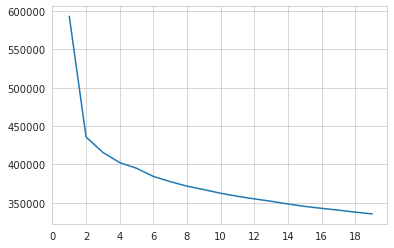

In [6]:
# select k

inertia_=[]
num_cluster=list(range(1,20,1))
methods=[]

for num in num_cluster:
    k_means = KMeans(n_clusters=num)
    methods.append(k_means.fit(data_scaled))
for m in methods:
    inertia_.append(m.inertia_)
    
plt.plot(num_cluster,inertia_)
plt.xticks(range(0,20,2))
plt.show

In [7]:
# choose k=2

kmeans = KMeans(n_clusters=2, random_state=0).fit(data_scaled)

kmeans.labels_

array([1, 1, 1, ..., 0, 0, 0], dtype=int32)

In [8]:
data_scaled.shape

(40000, 21)

## Hierarchical Clustering

In [9]:
clustering = AgglomerativeClustering(distance_threshold=0, n_clusters=None).fit(data_scaled)

clustering.labels_

array([28095, 37607, 33492, ...,     2,     1,     0])

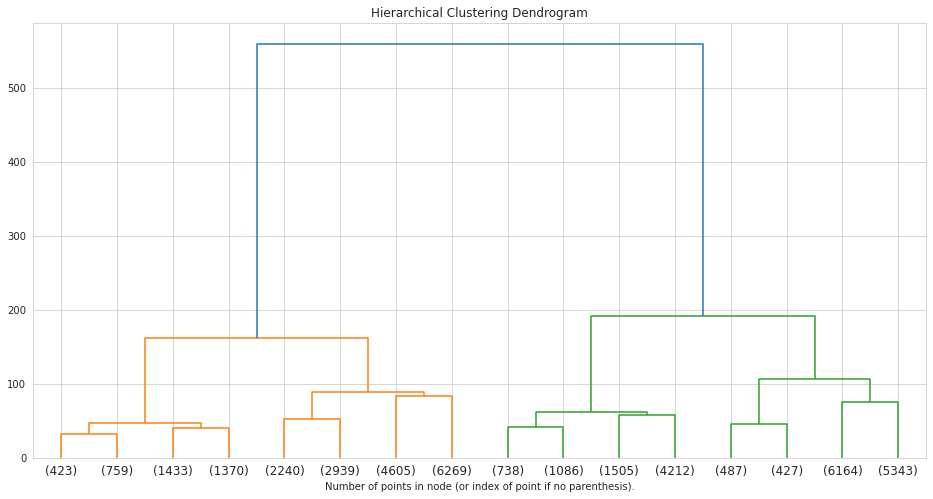

In [10]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

plt.figure(figsize=(16, 8))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(clustering, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

# Part II

In [11]:
data = pd.read_excel('Retail_Transaction_Example.xlsx')
data = data[data['CustomerID'].notna()]


## Identify numeric vs categorical variables

In [12]:
data['CustomerID'] = data['CustomerID'].apply(str)
data['StockCode'] = data['StockCode'].apply(str)
data['Description'] = data['Description'].apply(str)


categorical_features = data.select_dtypes(include=['object']).columns.tolist()
numeric_features = data.select_dtypes(exclude=['object']).columns.tolist()

print('Categorical features:', categorical_features)
print('Numeric features:', numeric_features)

Categorical features: ['CustomerID', 'StockCode', 'Description']
Numeric features: ['InvoiceDate']


## Association rules

In [13]:
from collections import Counter

transactions = []

for cust_id in data['CustomerID'].unique():
    stks = list(data[data['CustomerID']==cust_id]['StockCode'].values)
    stks = [x[0] for x in Counter(stks).most_common(5)]
    stks = stks[: min(5, len(stks))]
    transactions.append(stks)


In [14]:
transactions

[['82483', '21730', '22632', '85123A', '71053'],
 ['84969', '22720', '21755', '22960', '21658'],
 ['POST', '22728', '22326', '22726', '22492'],
 ['22423', '22086', '22084', '22843', '22841'],
 ['21258'],
 ['82486', '21754', '21755', '48188', '21668'],
 ['22379', '23182', '22381', '21934', '47310M'],
 ['23300', '22961', '22909', '22910', '22585'],
 ['15056N', '15056BL', '20829', '22411', '22778'],
 ['D', '82484', '22424', '22193', '22114'],
 ['22411', '22726', '22381', '22730', '22727'],
 ['82484', '84755', '22464', '21324', '22457'],
 ['22663', '22662', '22783', '22961', '22960'],
 ['85099B', '22207', '85152', '85099F', '22386'],
 ['21754', '21755', '21523', '21363', '21411'],
 ['22726', '22727', '21731', '85014A', '48138'],
 ['22197', '85099B', '85123A', '82484', '22170'],
 ['22585', '22082', '22081', '22079', '22926'],
 ['84879', '84950', '22150', '22619', '21891'],
 ['22180'],
 ['85123A', '21915', '21914', '22355', '20983'],
 ['21314', '22727', '22726', '22699', '22423'],
 ['35004B'

In [17]:
association_rules = apriori(transactions[:20], min_support=0.0045, min_confidence=0.2, min_lift=3, min_length=2)
association_results = list(association_rules)

## Viewing the Results

In [16]:
for item in association_results:
    
    pair = item[0]
    items = [x for x in pair]
    
    print("Rule : ", items[0], " -> " + items[1])
    print("Support : ", str(item[1]))
    print("Confidence : ",str(item[2][0][2]))
    print("Lift : ", str(item[2][0][3]))
    
    print("=============================") 

Rule :  21755  -> 21658
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  22720  -> 21658
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  21658  -> 22960
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  84969  -> 21658
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  21730  -> 22632
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  21730  -> 71053
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  21730  -> 82483
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  21730  -> 85123A
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  22720  -> 21755
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  21755  -> 22960
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  84969  -> 21755
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  22084  -> 22086
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  22084  -> 22423
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  22084  -> 22841
Support :  0.2
Confidence :  1.0
Lift :  5.0
Rule :  22843  -> 22084
Support :